In [9]:
pip install cufflinks

Note: you may need to restart the kernel to use updated packages.


In [10]:
import pandas as pd
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import datetime
import seaborn as sns
sns.set_style('whitegrid')
import plotly
import cufflinks as cf
cf.go_offline()
%matplotlib inline
from plotly.offline import iplot
import plotly.graph_objs as go

In [11]:
df=pd.read_csv('new_data.csv',index_col=0)
df

,India,U.S.,EUR,China,Quarter
Date,,,,,
2019-03-31,0.010465,0.721768,0.825242,0.107320,13
2019-06-30,0.010513,0.726449,0.818882,0.107555,14
2019-09-30,0.010575,0.733852,0.817598,0.105811,15
2019-12-31,0.010354,0.734203,0.810060,0.104242,16
2020-03-31,0.010259,0.743009,0.818428,0.105615,17
2020-06-30,0.009755,0.736259,0.820227,0.104045,18
2020-09-30,0.009671,0.726178,0.842056,0.104597,19
2020-12-31,0.009669,0.709359,0.848977,0.107206,20


# DBSCAN

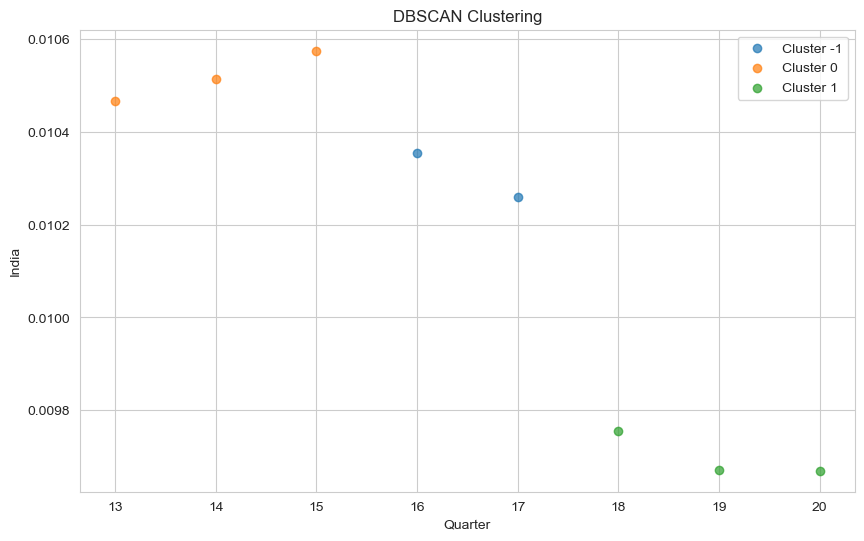

In [12]:
features = ['India','Quarter']#, 'U.S.', 'EUR', 'China']
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df[features])
dbscan = DBSCAN(eps=0.5, min_samples=2)  # Adjust eps and min_samples as needed
clusters = dbscan.fit_predict(df_scaled)

# Add cluster labels to DataFrame
df['Cluster'] = clusters

# Plot clusters
plt.figure(figsize=(10, 6))
for cluster in np.unique(clusters):
    plt.scatter(df[df['Cluster'] == cluster]['Quarter'], df[df['Cluster'] == cluster]['India'], label=f'Cluster {cluster}', alpha=0.7)
plt.xlabel('Quarter')
plt.ylabel('India')
plt.title('DBSCAN Clustering')
plt.legend()
plt.grid(True)
plt.show()

# PCA

C:\Users\asus\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\asus\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.



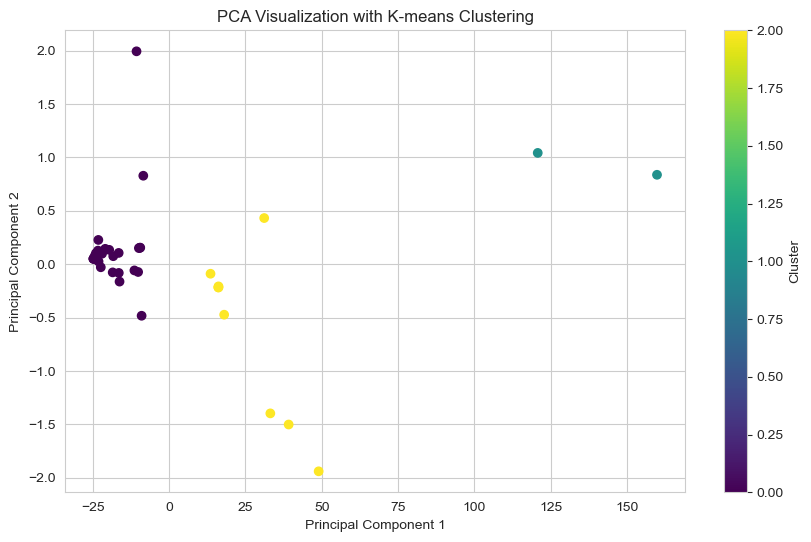

Country: Algeria, Cluster Label: 0
Country: Australia, Cluster Label: 2
Country: Botswana, Cluster Label: 0
Country: Brazil, Cluster Label: 0
Country: Brunei, Cluster Label: 2
Country: Canada, Cluster Label: 2
Country: Chile, Cluster Label: 0
Country: China, Cluster Label: 0
Country: Colombia, Cluster Label: 0
Country: Czech Republic, Cluster Label: 0
Country: Denmark, Cluster Label: 0
Country: EUR, Cluster Label: 2
Country: India, Cluster Label: 0
Country: Israel, Cluster Label: 0
Country: Japan, Cluster Label: 0
Country: Korean, Cluster Label: 0
Country: Kuwait, Cluster Label: 1
Country: Malaysia, Cluster Label: 0
Country: Mauritius, Cluster Label: 0
Country: Mexico, Cluster Label: 0
Country: New Zealand, Cluster Label: 2
Country: Norway, Cluster Label: 0
Country: Oman, Cluster Label: 1
Country: Peru, Cluster Label: 0
Country: Philippines, Cluster Label: 0
Country: Poland, Cluster Label: 0
Country: Qatar, Cluster Label: 0
Country: Russia, Cluster Label: 0
Country: Saudi Arabia, Clust

In [13]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Load your SDR dataset into a pandas DataFrame
# Replace 'your_dataset.csv' with the actual path to your dataset file
df = pd.read_csv('cleaned_exchange_rate.csv')

# Transpose the DataFrame to have dates as rows and countries as columns
transposed_df = df.T  # Transpose the DataFrame

# Extract the SDR values (assuming they are numerical values)
sdr_values = transposed_df.drop(index=['Date'])  # Remove the 'Date' index

# Standardize the SDR values (mean=0, std=1)
scaler = StandardScaler()
scaled_sdr_values = scaler.fit_transform(sdr_values)

# Perform PCA
pca = PCA(n_components=2)  # Specify the number of components (e.g., 2 for 2D visualization)
pca_result = pca.fit_transform(scaled_sdr_values)

# Perform K-means clustering
kmeans = KMeans(n_clusters=3, random_state=0)  # Specify the number of clusters (e.g., 3 clusters)
cluster_labels = kmeans.fit_predict(pca_result)

# Plotting PCA results with clusters
plt.figure(figsize=(10, 6))
plt.scatter(pca_result[:, 0], pca_result[:, 1], c=cluster_labels, cmap='viridis')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Visualization with K-means Clustering')
plt.colorbar(label='Cluster')
plt.grid(True)
plt.show()

# Print cluster labels for countries
countries = list(transposed_df.iloc[1:,:0].T ) # Assuming the first column is 'Date'
for country, cluster_label in zip(countries, cluster_labels):
    print(f"Country: {country}, Cluster Label: {cluster_label}")



# Forward Feature Selection

In [18]:
df.head(n=10)

,Date,Algeria,Australia,Botswana,Brazil,Brunei,Canada,Chile,China,Colombia,...,Singapore,South Africa,Sweden,Switzerland,Thailand,Trinidadian,U.A.E.,U.K.,U.S.,Uruguay
0,01-04-2016,0.006710,0.520544,0.064140,0.184561,0.506341,0.515910,0.001015,0.110659,0.000229,...,0.506341,0.046369,0.085704,0.721685,0.019929,0.112887,0.196236,1.06444,0.720675,0.024011
1,01-05-2016,0.006723,0.522630,0.064223,0.179481,0.508786,0.518022,0.001011,0.111183,0.000226,...,0.508786,0.045834,0.085161,0.717691,0.020065,0.112887,0.197377,1.06331,0.724868,0.024011
2,01-06-2016,0.006723,0.516299,0.063713,0.180693,0.506380,0.514650,0.001014,0.110623,0.000226,...,0.506380,0.045834,0.084140,0.718581,0.020014,0.112829,0.197368,1.06282,0.724833,0.023704
3,01-07-2016,0.006725,0.508623,0.063135,0.179236,0.503045,0.513742,0.001001,0.109555,0.000222,...,0.503045,0.044869,0.084140,0.722156,0.019900,0.112381,0.196698,1.05221,0.722373,0.023704
4,01-08-2016,0.006717,0.510064,0.063352,0.178473,0.503849,0.510471,0.001001,0.109636,0.000220,...,0.503849,0.045201,0.085012,0.722946,0.019936,0.112734,0.196697,1.05480,0.722368,0.023704
5,01-11-2016,0.006726,0.503475,0.062140,0.179310,0.501929,0.508077,0.000998,0.109605,0.000221,...,0.501929,0.043515,0.084763,0.724477,0.019882,0.112221,0.196521,1.05141,0.721724,0.023586
6,01-12-2016,0.006729,0.505011,0.062150,0.180189,0.502823,0.506271,0.000991,0.110013,0.000221,...,0.502823,0.043500,0.084912,0.723512,0.019925,0.112897,0.197008,1.04417,0.723512,0.023584
7,1/13/2016,0.006737,0.509646,0.062465,0.179818,0.505018,0.506961,0.000992,0.110181,0.000223,...,0.505018,0.043988,0.084848,0.719256,0.019981,0.113306,0.197318,1.04292,0.724650,0.023610
8,1/14/2016,0.006727,0.500386,0.062169,0.181135,0.501847,0.502370,0.000994,0.109597,0.000223,...,0.501847,0.043576,0.084734,0.720688,0.019886,0.112494,0.196612,1.03861,0.722057,0.023536
9,1/15/2016,0.006739,0.502188,0.062087,0.179693,0.502140,0.497508,0.000996,0.109728,0.000223,...,0.502140,0.043384,0.084611,0.719757,0.019905,0.112511,0.196809,1.03733,0.722780,0.023490


In [19]:
import pandas as pd
import numpy as np

data = pd.read_csv("cleaned_exchange_rate.csv", na_values=['NaN ','NULL','NA',' Nan', 'NaN',' NaN'])
data = data.fillna(method='bfill')
data = data.dropna()
df= data
df.head()
df['Date'] = pd.to_datetime(df['Date'],format='mixed')

df_quarters = df.groupby(pd.Grouper(key='Date', freq='Q')).max()

df_quarters['Quarter'] = range(1, len(df_quarters) + 1)
df_2020_2021 = df_quarters[-12:-6]
df_2020_2021 = df_2020_2021[["India",'U.S.',"EUR","China","Quarter"]]
quarterly_means = df_2020_2021.groupby('Quarter').transform(lambda x: x.mean())
df_2020_2021['Mean SDR'] = quarterly_means.mean(axis=1)
df_2020_2021.to_csv('cleaned.csv',index=True)

C:\Users\asus\AppData\Local\Temp\ipykernel_36760\1491249688.py:5: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



In [20]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

df = pd.read_csv("cleaned.csv")

X = df.drop(columns=["Date","Quarter", "Mean SDR"])
y = df['Mean SDR']

def forward_feature_selection(X, y, metric=mean_squared_error):
    selected_features = []  
    best_score = float('inf')  

    while True:
        best_feature = None
        for feature in X.columns:
            if feature not in selected_features:
                features_to_use = selected_features + [feature]
                X_subset = X[features_to_use]
                model = LinearRegression()
                model.fit(X_subset, y)
                y_pred = model.predict(X_subset)               
                score = metric(y, y_pred)                
                if score < best_score:
                    best_score = score
                    best_feature = feature
        
        if best_feature is None:
            break
        
        selected_features.append(best_feature)
        print(f"Selected feature: {best_feature}, Score: {best_score}")
    
    return selected_features, best_score

selected_features, best_score = forward_feature_selection(X, y)

print("Selected features:", selected_features)
print("Best score:", best_score)

Selected feature: U.S., Score: 1.230883215616008e-06
Selected feature: EUR, Score: 7.449378875264098e-08
Selected feature: China, Score: 1.0182885900165917e-09
Selected feature: India, Score: 5.135813185032629e-34
Selected features: ['U.S.', 'EUR', 'China', 'India']
Best score: 5.135813185032629e-34


In [21]:
df = pd.read_csv('cleaned_exchange_rate.csv', index_col=0)
df.head(5)

,Algeria,Australia,Botswana,Brazil,Brunei,Canada,Chile,China,Colombia,Czech Republic,...,Singapore,South Africa,Sweden,Switzerland,Thailand,Trinidadian,U.A.E.,U.K.,U.S.,Uruguay
Date,,,,,,,,,,,,,,,,,,,,,
01-04-2016,0.006710,0.520544,0.064140,0.184561,0.506341,0.515910,0.001015,0.110659,0.000229,0.029066,...,0.506341,0.046369,0.085704,0.721685,0.019929,0.112887,0.196236,1.06444,0.720675,0.024011
01-05-2016,0.006723,0.522630,0.064223,0.179481,0.508786,0.518022,0.001011,0.111183,0.000226,0.028827,...,0.508786,0.045834,0.085161,0.717691,0.020065,0.112887,0.197377,1.06331,0.724868,0.024011
01-06-2016,0.006723,0.516299,0.063713,0.180693,0.506380,0.514650,0.001014,0.110623,0.000226,0.028768,...,0.506380,0.045834,0.084140,0.718581,0.020014,0.112829,0.197368,1.06282,0.724833,0.023704
01-07-2016,0.006725,0.508623,0.063135,0.179236,0.503045,0.513742,0.001001,0.109555,0.000222,0.029042,...,0.503045,0.044869,0.084140,0.722156,0.019900,0.112381,0.196698,1.05221,0.722373,0.023704
01-08-2016,0.006717,0.510064,0.063352,0.178473,0.503849,0.510471,0.001001,0.109636,0.000220,0.029042,...,0.503849,0.045201,0.085012,0.722946,0.019936,0.112734,0.196697,1.05480,0.722368,0.023704


In [22]:
df.idxmin()

Algeria            9/15/2021
Australia          3/19/2020
Botswana           4/24/2020
Brazil            03-09-2021
Brunei             1/14/2016
Canada             1/20/2016
Chile             12/22/2021
China              7/31/2020
Colombia          08-10-2021
Czech Republic    12/30/2016
Denmark           12/20/2016
EUR               12/20/2016
India              4/21/2021
Israel             1/20/2016
Japan             02-01-2016
Korean             3/20/2020
Kuwait            01-06-2021
Malaysia          01-07-2016
Mauritius          7/30/2021
Mexico             3/24/2020
New Zealand        3/23/2020
Norway             3/19/2020
Oman               3/26/2018
Peru               9/15/2021
Philippines        3/26/2018
Poland            11/22/2021
Qatar              3/26/2018
Russia             1/21/2016
Saudi Arabia       3/26/2018
Singapore          1/14/2016
South Africa       4/21/2020
Sweden             3/23/2020
Switzerland       05-07-2018
Thailand          01-11-2016
Trinidadian   

In [23]:
df.idxmax()

Algeria           02-09-2016
Australia          7/27/2017
Botswana           2/23/2018
Brazil             2/17/2017
Brunei             1/13/2020
Canada            09-12-2017
Chile              2/28/2018
China             12-09-2021
Colombia           2/13/2017
Czech Republic    02-02-2018
Denmark           02-02-2018
EUR               02-02-2018
India             04-07-2017
Israel            11/17/2021
Japan             07-11-2016
Korean            04-04-2017
Kuwait            01-03-2017
Malaysia           4/13/2016
Mauritius          8/30/2017
Mexico            01-05-2016
New Zealand       02-06-2017
Norway             8/29/2017
Oman              01-03-2017
Peru               2/22/2017
Philippines        4/14/2016
Poland             2/16/2018
Qatar             01-03-2017
Russia            04-05-2017
Saudi Arabia      01-03-2017
Singapore          1/13/2020
South Africa       2/23/2018
Sweden             8/31/2017
Switzerland       01-06-2021
Thailand          10-09-2019
Trinidadian   

In [24]:
df.std()

Algeria           0.000490
Australia         0.023933
Botswana          0.003182
Brazil            0.036239
Brunei            0.005572
Canada            0.012923
Chile             0.000088
China             0.002351
Colombia          0.000024
Czech Republic    0.001313
Denmark           0.002543
EUR               0.018618
India             0.000580
Israel            0.010051
Japan             0.000212
Korean            0.000018
Kuwait            0.035705
Malaysia          0.003878
Mauritius         0.001552
Mexico            0.002418
New Zealand       0.020885
Norway            0.004366
Oman              0.034710
Peru              0.014079
Philippines       0.000581
Poland            0.006827
Qatar             0.003667
Russia            0.001078
Saudi Arabia      0.003549
Singapore         0.005574
South Africa      0.004417
Sweden            0.003684
Switzerland       0.020519
Thailand          0.001076
Trinidadian       0.002263
U.A.E.            0.003635
U.K.              0.033604
U

In [25]:
import pandas as pd

# Load the Excel file
excel_file_path = 'updatedTimeline.csv'
df1 = pd.read_csv(excel_file_path)

# Function to convert date formats
def convert_date(date_str):
    if pd.isnull(date_str):
        return None  # Return None for empty cells
    try:
        # Try parsing the date assuming it's in the format 'MM-DD-YYYY'
        return pd.to_datetime(date_str, format='%m-%d-%Y').strftime('%#m/%#d/%Y')
    except ValueError:
        # If parsing fails, try another format 'MM/DD/YY HH:mm'
        return pd.to_datetime(date_str, format='%m/%d/%y %H:%M').strftime('%#m/%#d/%Y')


# Apply the conversion function to the date column
df1['FullDate'] = df1['FullDate'].apply(convert_date)
df1=df1.drop(columns=['Date'])
df1=df1.rename(columns={"FullDate": "Date"})
df1

,Year,Description,Date,Country
0,2010,"A 7.0 magnitude earthquake in Haiti kills 230,...",1/12/2010,Haiti
1,2010,2010 Nigerien coup d'état.,2/18/2010,Niger
2,2010,2010 Moscow Metro bombings.,3/29/2010,Russia
3,2010,"The President of Poland, Lech Kaczyński, is am...",4/10/2010,Russia
4,2010,The largest oil spill in US history occurs in ...,4/20/2010,U.S.
...,...,...,...,...
244,2023,"Operation 1027, a coordinated assault by anti-...",10/27/2023,NaN
245,2023,Somalia admitted to East African Community.,11/24/2023,NaN
246,2023,COP28 ends with world leaders pledging transit...,12/12/2023,NaN
247,2023,Catholic Church releases Fiducia supplicans.,12/18/2023,NaN


In [26]:
import pandas as pd

# Assuming you have two dataframes df1 and df2
# with columns 'date' and 'description' in df2

# Merge the dataframes on the 'date' column
merged_df = pd.merge(df, df1[['Date','Description']], on='Date', how='left')

# If 'date' is not the index, you can also use:
# merged_df = pd.merge(df1, df2, left_on='date', right_on='date', how='left')

# 'how='left'' ensures that all rows from df1 are included in the merged dataframe
# and corresponding descriptions from df2 are added where dates are common

# Save the merged dataframe to a new Excel file
merged_df.to_excel('merged_data.xlsx', index=False)
df=pd.read_excel('merged_data.xlsx',index_col=0)

# Interactive Plot

In [27]:
traces = []
# for column in df.columns:
#     trace = go.Scatter(x=df.index, y=df[column], mode='lines', name=column)
#     traces.append(trace)
for column in df.columns:
    if column != 'Description':

        # Create Scatter trace for each column
        trace = go.Scatter(
            x=df.index,
            y=df[column],
            mode='lines',
            name=column,
            hovertext=df['Description'],  # Use 'Description' column for hover text
        )
        traces.append(trace)

layout = go.Layout(title='Value of currency over time',
                   xaxis=dict(title='Date'),
                   yaxis=dict(title='Value'))

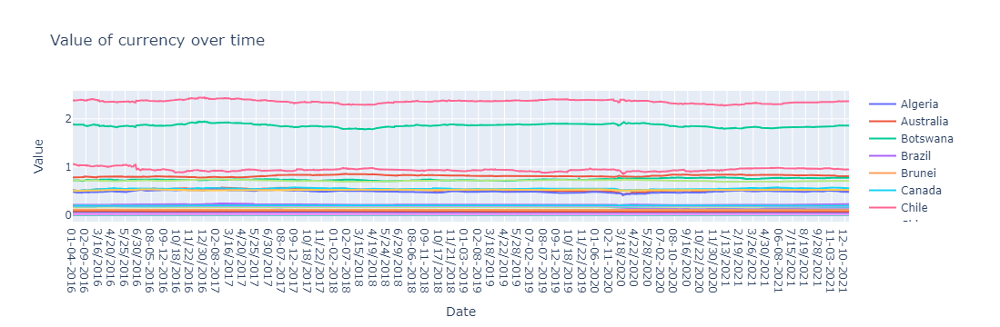

In [28]:
fig = go.Figure(data=traces, layout=layout)
iplot(fig)

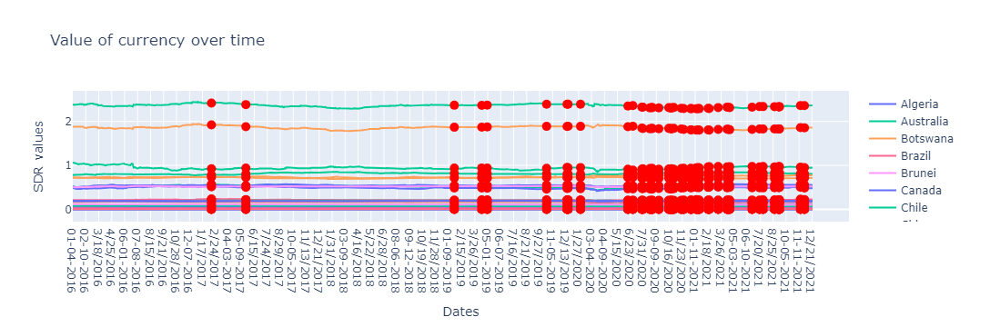

In [29]:
import plotly.graph_objects as go
import pandas as pd

# Assuming df is your dataframe containing 'Date' and 'Description' columns

# Create traces list to store Scatter plot traces
traces = []

# Create hover text with date and description (if available)
# hover_text = df.apply(lambda row: f"{row['Date']}: {row['Description']}" if not pd.isnull(row['Description']) else row['Date'], axis=1)
for column in df.columns:
    if column != 'Description':
        marker_color = ['red' if not pd.isnull(desc) else 'blue' for desc in df['Description']]

        # Create Scatter trace for each column
        trace = go.Scatter(
            x=df.index,
            y=df[column],
            mode='lines',
            name=column,
            marker=dict(color=marker_color),
            hovertext=df['Description'],  # Use 'Description' column for hover text
        )
        traces.append(trace)
# Create Scatter trace for points with descriptions
        trace_points = go.Scatter(
                x=df[df['Description'].notnull()].index,
                y=df[df['Description'].notnull()][column],  # Replace 'YourColumnNameHere' with the appropriate column name
                mode='markers',
                marker=dict(color='red', size=10),
                hoverinfo=None,
                hovertemplate="<extra></extra>",
                name="",
                showlegend=False
            )
        traces.append(trace_points)
# for column in df.columns:
#     trace_points = go.Scatter(
#         x=df[df['Description'].notnull()].index,
#         y=df[df['Description'].notnull()][column],  # Replace 'YourColumnNameHere' with the appropriate column name
#         mode='markers',
#         marker=dict(color='red', size=8),
#         hovertext=df['Description'].notnull(),
#         name='Points with Description',
#     )
#     traces.append(trace_points)

#     # Create Scatter trace for lines
#     trace_lines = go.Scatter(
#         x=df.index,
#         y=df[column],  # Replace 'YourColumnNameHere' with the appropriate column name
#         mode='lines',
#         name=column,
#     )
#     traces.append(trace_lines)

# Create layout for the plot
layout = go.Layout(title='Value of currency over time', xaxis=dict(title='Dates'), yaxis=dict(title='SDR values'))

# Create figure object
fig = go.Figure(data=traces, layout=layout)

# Show the figure (optional)
iplot(fig)

# If you want to save the figure to an HTML file
# fig.write_html('scatter_plot.html')
